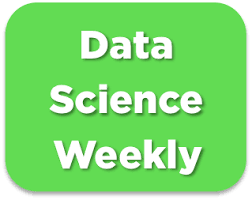

# Challenge : predict conversions 🏆🏆

This is the template that shows the different steps of the challenge. In this notebook, all the training/predictions steps are implemented for a very basic model (logistic regression with only one variable). Please use this template and feel free to change the preprocessing/training steps to get the model with the best f1-score ! May the force be with you 🧨🧨  

**For a detailed description of this project, please refer to *02-Conversion_rate_challenge.ipynb*.**

# 0/ Import libraries

In [1]:
# --- Basic Import ---
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

# --- Preprocessing ---
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline


# --- Classic Model ---
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, 
    GradientBoostingClassifier, ExtraTreesClassifier, HistGradientBoostingClassifier
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

# --- Optimizer ---
import optuna
from sklearn.model_selection import GridSearchCV

# --- Score ---
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, f1_score, confusion_matrix

# --- Visualisation ---
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import display, clear_output


# I/ Read files

In [2]:
data_test_x = pd.read_csv('conversion_data_test.csv')
data = pd.read_csv('conversion_data_train.csv')
print('Set with labels (our train+test) :', data.shape)
print(f'Data info : {data.info()}')

Set with labels (our train+test) : (284580, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284580 entries, 0 to 284579
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   country              284580 non-null  object
 1   age                  284580 non-null  int64 
 2   new_user             284580 non-null  int64 
 3   source               284580 non-null  object
 4   total_pages_visited  284580 non-null  int64 
 5   converted            284580 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 13.0+ MB
Data info : None


## 00/ explore all data

In [3]:
data.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


In [4]:
data.describe(include='all')

,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


In [5]:
for col in data.columns:
    unique = data[f'{col}'].unique()
    print(f'col name : {col}')
    print(f'unique value : {unique}')
    print('\n')

col name : country
unique value : ['China' 'UK' 'Germany' 'US']


col name : age
unique value : [ 22  21  20  23  28  29  30  38  26  31  18  27  24  37  42  33  45  32
  39  17  34  40  25  36  62  44  55  41  35  49  19  43  50  47  53  52
  46  48  58  51  57  56  61  59  60  54  67  63 111  65  64  66  72  68
  69  70  73  79 123  77]


col name : new_user
unique value : [1 0]


col name : source
unique value : ['Direct' 'Ads' 'Seo']


col name : total_pages_visited
unique value : [ 2  3 14  7  4  5  1 10  6 11 16  9  8 12 19 20 15 21 13 23 18 17 22 25
 24 26 27 29 28]


col name : converted
unique value : [0 1]




In [6]:
convert_percen = (data['converted'].mean())*100
print(f'converted = {convert_percen:,.2f} %')

converted = 3.23 %


## 01/ visualise juste a data sample set with Labels

In [ ]:
# The dataset is quite big : you must create a sample of the dataset before making any visualizations !
data_sample = data.sample(10_000)

In [7]:
px.scatter_matrix(data_sample, width=1000, height=1000)

In [8]:
for col in data_sample.drop('converted', axis=1).columns:
    px.bar(data_sample, x=col, y='converted',
               width=600, height=300,).update_layout(margin=dict(l=10, r=10, t=10, b=10)).show()

## 02/ what about all datas ?

test
<a id='eda'></a>

In [ ]:
for col in data.columns:
    px.histogram(data, x=col,
                 histnorm='percent',
               width=600, height=300).update_layout(margin=dict(l=10, r=10, t=10, b=10)).show()

# III / Preprocess

In [9]:
train_df = data.copy(deep=True)

## 01/ Choose variables to use in the model, and create train and test sets

**From the EDA, we know that the most useful feature is total_pages_visited. Let's create a baseline model by using at first only this feature : in the next cells, we'll make preprocessings and train a simple (univariate) logistic regression.**

In [10]:
data = data[data['age'] <= 100]
data['new_user'] = data['new_user'].astype('bool')
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 284578 entries, 0 to 284579
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   country              284578 non-null  object
 1   age                  284578 non-null  int64 
 2   new_user             284578 non-null  bool  
 3   source               284578 non-null  object
 4   total_pages_visited  284578 non-null  int64 
 5   converted            284578 non-null  int64 
dtypes: bool(1), int64(3), object(2)
memory usage: 13.3+ MB


In [11]:
target = 'converted'

y = data[[target]]
X = data.drop(target, axis=1)

In [12]:
numerical_features = X.select_dtypes(include=np.number).columns.tolist()
categorical_features = X.select_dtypes(exclude=np.number).columns.tolist()
print(f' numerical feature => {numerical_features}')
print(f' categorical feature => {categorical_features}')

 numerical feature => ['age', 'total_pages_visited']
 categorical feature => ['country', 'new_user', 'source']


In [13]:
# Divide dataset Train set & Test set 
print("Dividing into train and test sets...")
x_train, x_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    random_state=42,
                                                    stratify = y)
print("...Done.")
print()

Dividing into train and test sets...
...Done.



## 02/ Standardisation pipeline

In [14]:
print("Encoding categorical features and standardizing numerical features...")
# Create pipeline for numeric features
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Create pipeline for categorical features
categorical_transformer = Pipeline(
    steps=[
    ('encoder', OneHotEncoder()) # first column will be dropped to avoid creating correlations between features
    ])

# Use ColumnTransformer to make a preprocessor object that describes all the treatments to be done
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Preprocessings on train set
print("...Performing preprocessings on train set...")
print(x_train.head())
x_train = preprocessor.fit_transform(x_train)
print('...Done...')
print(x_train[0:5]) 
print()

# Preprocessings on test set
print("...Performing preprocessings on test set...")
print(x_test.head()) 
x_test = preprocessor.transform(x_test) # Don't fit again !! 
print('...Done...')
print(x_test[0:5,:])

print("...all Done")

Encoding categorical features and standardizing numerical features...
...Performing preprocessings on train set...
        country  age  new_user  source  total_pages_visited
14322        UK   37      True     Ads                    3
251570       UK   27     False     Seo                   13
53008        US   26     False  Direct                    4
121373       US   24     False     Seo                    1
151639  Germany   33     False     Ads                    2
...Done...
[[ 0.77869487 -0.56105227  0.          0.          1.          0.
   0.          1.          1.          0.          0.        ]
 [-0.43027253  2.43067457  0.          0.          1.          0.
   1.          0.          0.          0.          1.        ]
 [-0.55116927 -0.26187958  0.          0.          0.          1.
   1.          0.          0.          1.          0.        ]
 [-0.79296275 -1.15939764  0.          0.          0.          1.
   1.          0.          0.          0.          1.        

In [15]:
preprocessor.get_feature_names_out()

array(['num__age', 'num__total_pages_visited', 'cat__country_China',
       'cat__country_Germany', 'cat__country_UK', 'cat__country_US',
       'cat__new_user_False', 'cat__new_user_True', 'cat__source_Ads',
       'cat__source_Direct', 'cat__source_Seo'], dtype=object)

# IV/ Make Auto find best ML model with best params 

## 01/ Training pipeline

In [16]:
# Train model
print("Train model...")
Baseline_classifier = LogisticRegression()
Baseline_classifier.fit(x_train, y_train)
print("...Done.")

Train model...
...Done.


In [17]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = Baseline_classifier.predict(x_train)
print("...Done.")
print(Y_train_pred)
print()

Predictions on training set...
...Done.
[0 1 0 ... 0 0 0]



## 02/ Test pipeline

In [18]:
# # Use X_test, and the same preprocessings as in training pipeline, 
# # but call "transform()" instead of "fit_transform" methods (see example below)

# print("Encoding categorical features and standardizing numerical features...")

# x_test = preprocessor.transform(x_test)
# print("...Done")
# print(x_test)

In [19]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = Baseline_classifier.predict(x_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on test set...
...Done.
[0 0 1 ... 0 0 0]



## 03/ Performance assessment

In [20]:
# WARNING : Use the same score as the one that will be used by Kaggle !
# Here, the f1-score will be used to assess the performances on the leaderboard
print("f1-score on train set : ", f1_score(y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(y_test, Y_test_pred))

f1-score on train set :  0.7651168031247653
f1-score on test set :  0.7589774802191114


In [21]:
# You can also check more performance metrics to better understand what your model is doing
print("Confusion matrix on train set : ")
print(confusion_matrix(y_train, Y_train_pred))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(y_test, Y_test_pred))
print()

Confusion matrix on train set : 
[[219442    878]
 [  2249   5093]]

Confusion matrix on test set : 
[[54877   203]
 [  589  1247]]



**Our baseline model reaches a f1-score of almost 70%. Now, feel free to refine your model and try to beat this score ! 🚀🚀**

## 04/ let's find the best model and the best params

### 04.1/ baseline

In [22]:
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, 
    GradientBoostingClassifier, ExtraTreesClassifier, HistGradientBoostingClassifier
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [23]:
models = {
    'LR': LogisticRegression(max_iter=10_000),
    'Ridge' : RidgeClassifier(),
    'RFC' : RandomForestClassifier(),
    'BagClass': BaggingClassifier(),
    'Adaboost': AdaBoostClassifier(),
    'GBC': GradientBoostingClassifier(), 
    'Extra': ExtraTreesClassifier(),
    'HGBC' : HistGradientBoostingClassifier(),
    'DTC' : DecisionTreeClassifier(),
    'SVC' : SVC(),
    'XGBC' : XGBClassifier(tree_method='gpu_hist', predictor='gpu_predictor')
}

In [24]:
for name, model in models.items():
    print(name)
    model.fit(x_train, y_train)
    y_preds = model.predict(x_test)
    print(f1_score(y_true=y_test, y_pred=y_preds))

LR
0.7589774802191114
Ridge
0.10526315789473684
RFC
0.7372502236802864
BagClass
0.7351448193490594
Adaboost
0.7408527366192924
GBC
0.7566250380749314
Extra
0.7310975609756097
HGBC
0.7620762076207621
DTC
0.7237687366167024
SVC
0.7461368653421634
XGBC
0.7544180377818404


In [25]:
for name, model in models.items():
    model.fit(x_train, y_train)
    y_preds = model.predict(x_test)
    f1 = f1_score(y_true=y_test, y_pred=y_preds)
    if f1 >= 0.75 :
        print(name)
        print(f1)
        print(classification_report(y_true=y_test, y_pred=y_preds), '\n')


LR
0.7589774802191114
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     55080
           1       0.86      0.68      0.76      1836

    accuracy                           0.99     56916
   macro avg       0.92      0.84      0.88     56916
weighted avg       0.99      0.99      0.99     56916
 

GBC
0.7566250380749314
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     55080
           1       0.86      0.68      0.76      1836

    accuracy                           0.99     56916
   macro avg       0.92      0.84      0.87     56916
weighted avg       0.99      0.99      0.99     56916
 

HGBC
0.7563329312424608
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     55080
           1       0.85      0.68      0.76      1836

    accuracy                           0.99     56916
   macro avg       0.92      0.84      0.87     56916
w

### 04.2/ Optimise Best Baseline

In [26]:
# model to optimise :

models_opt = {
    'LR': LogisticRegression(max_iter=10_000),
    'GBC': GradientBoostingClassifier(), 
    'HGBC' : HistGradientBoostingClassifier(),
    'XGBC' : XGBClassifier(tree_method='gpu_hist', predictor='gpu_predictor')
}

In [27]:
def LR_params(trial):
    return {
        "C": trial.suggest_float("C", 0.01, 10.0, log=True)
    }

def GBC_params(trial):    
    return {
        "n_estimators": trial.suggest_int("n_estimators", 50, 300),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3)
    }

def HGBC_params(trial): 
        return {
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3)
    }

def XGBC_params(trial):
    return {
        "n_estimators": trial.suggest_int("n_estimators", 100, 400),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3)
    }


In [28]:
def tune_with_optuna(model, param_func, x_train, y_train):
    def objective(trial):
        params = param_func(trial)
        clf = model.__class__(**params)
        score = cross_val_score(clf, x_train, y_train, cv=3, scoring="f1_weighted").mean()
        return score

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30, n_jobs=1, show_progress_bar=True)
    return study.best_params, study.best_value

In [29]:
optuna_results = {}
for name in models_opt:
    if name == "LR":
        params, score = tune_with_optuna(models_opt[name], LR_params, x_train, y_train)
    elif name == "GBC":
        params, score = tune_with_optuna(models_opt[name], GBC_params, x_train, y_train)
    elif name == "HGBC":
        params, score = tune_with_optuna(models_opt[name], HGBC_params, x_train, y_train)
    elif name == "XGBC":
        params, score = tune_with_optuna(models_opt[name], XGBC_params, x_train, y_train)
    else:
        continue
    optuna_results[name] = {"params": params, "score": score}

optuna_results_df = pd.DataFrame(optuna_results).T.sort_values(by="score", ascending=False)
optuna_results_df

[I 2025-10-17 12:02:31,655] A new study created in memory with name: no-name-5f43d52f-7f41-4570-b75a-f06d84339ee8


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-10-17 12:02:32,105] Trial 0 finished with value: 0.9855704615373438 and parameters: {'C': 6.093116841141277}. Best is trial 0 with value: 0.9855704615373438.
[I 2025-10-17 12:02:32,565] Trial 1 finished with value: 0.9855589476386296 and parameters: {'C': 1.6776776966790672}. Best is trial 0 with value: 0.9855704615373438.
[I 2025-10-17 12:02:33,191] Trial 2 finished with value: 0.9854713819905472 and parameters: {'C': 0.10606528374917355}. Best is trial 0 with value: 0.9855704615373438.
[I 2025-10-17 12:02:33,579] Trial 3 finished with value: 0.985533096782332 and parameters: {'C': 0.34135004032139166}. Best is trial 0 with value: 0.9855704615373438.
[I 2025-10-17 12:02:34,100] Trial 4 finished with value: 0.9854135009910933 and parameters: {'C': 0.030660111484764083}. Best is trial 0 with value: 0.9855704615373438.
[I 2025-10-17 12:02:34,564] Trial 5 finished with value: 0.985506152560658 and parameters: {'C': 0.2567718607052612}. Best is trial 0 with value: 0.985570461537343

[I 2025-10-17 12:02:45,504] A new study created in memory with name: no-name-be8e25d3-99c5-4e12-9d3d-2f16336f92c7


[I 2025-10-17 12:02:45,502] Trial 29 finished with value: 0.9855609156646317 and parameters: {'C': 1.2555734883097063}. Best is trial 0 with value: 0.9855704615373438.


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-10-17 12:03:33,901] Trial 0 finished with value: 0.9853587173088275 and parameters: {'n_estimators': 187, 'learning_rate': 0.157943227961792}. Best is trial 0 with value: 0.9853587173088275.
[I 2025-10-17 12:04:30,523] Trial 1 finished with value: 0.985224932524512 and parameters: {'n_estimators': 213, 'learning_rate': 0.22437903431396783}. Best is trial 0 with value: 0.9853587173088275.
[I 2025-10-17 12:05:41,943] Trial 2 finished with value: 0.9853457862517764 and parameters: {'n_estimators': 250, 'learning_rate': 0.13595596900908608}. Best is trial 0 with value: 0.9853587173088275.
[I 2025-10-17 12:06:50,360] Trial 3 finished with value: 0.9851752714783609 and parameters: {'n_estimators': 239, 'learning_rate': 0.2956622614934043}. Best is trial 0 with value: 0.9853587173088275.
[I 2025-10-17 12:07:29,104] Trial 4 finished with value: 0.9853233977480663 and parameters: {'n_estimators': 145, 'learning_rate': 0.26629778347131494}. Best is trial 0 with value: 0.9853587173088275.

[I 2025-10-17 12:20:37,453] A new study created in memory with name: no-name-e40635c0-873e-4299-a39e-cd6e2a122272


[I 2025-10-17 12:20:37,452] Trial 29 finished with value: 0.985342088577824 and parameters: {'n_estimators': 162, 'learning_rate': 0.16498405019592943}. Best is trial 28 with value: 0.9854929297022818.


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-10-17 12:20:38,722] Trial 0 finished with value: 0.9851136521925407 and parameters: {'max_depth': 7, 'learning_rate': 0.23013399577045918}. Best is trial 0 with value: 0.9851136521925407.
[I 2025-10-17 12:20:39,729] Trial 1 finished with value: 0.985429321178367 and parameters: {'max_depth': 11, 'learning_rate': 0.21625453155206262}. Best is trial 1 with value: 0.985429321178367.
[I 2025-10-17 12:20:41,490] Trial 2 finished with value: 0.985357507265916 and parameters: {'max_depth': 3, 'learning_rate': 0.12328674961124009}. Best is trial 1 with value: 0.985429321178367.
[I 2025-10-17 12:20:42,723] Trial 3 finished with value: 0.9854176039734971 and parameters: {'max_depth': 4, 'learning_rate': 0.227631303094896}. Best is trial 1 with value: 0.985429321178367.
[I 2025-10-17 12:20:43,993] Trial 4 finished with value: 0.9853661511511772 and parameters: {'max_depth': 12, 'learning_rate': 0.14446003042935324}. Best is trial 1 with value: 0.985429321178367.
[I 2025-10-17 12:20:45,216

[I 2025-10-17 12:21:29,881] A new study created in memory with name: no-name-27c94ab2-cb59-4f44-b443-801c592cd758


[I 2025-10-17 12:21:29,879] Trial 29 finished with value: 0.9852863449503584 and parameters: {'max_depth': 9, 'learning_rate': 0.1788639297813407}. Best is trial 9 with value: 0.9854536165261122.


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-10-17 12:21:32,840] Trial 0 finished with value: 0.9844749961291018 and parameters: {'n_estimators': 336, 'max_depth': 7, 'learning_rate': 0.2273841607814912}. Best is trial 0 with value: 0.9844749961291018.
[I 2025-10-17 12:21:34,818] Trial 1 finished with value: 0.9851887319938936 and parameters: {'n_estimators': 173, 'max_depth': 9, 'learning_rate': 0.051053975083776675}. Best is trial 1 with value: 0.9851887319938936.
[I 2025-10-17 12:21:38,006] Trial 2 finished with value: 0.9851796321687284 and parameters: {'n_estimators': 382, 'max_depth': 7, 'learning_rate': 0.05505675552352971}. Best is trial 1 with value: 0.9851887319938936.
[I 2025-10-17 12:21:39,249] Trial 3 finished with value: 0.9849667722580763 and parameters: {'n_estimators': 112, 'max_depth': 8, 'learning_rate': 0.18285360143124924}. Best is trial 1 with value: 0.9851887319938936.
[I 2025-10-17 12:21:42,049] Trial 4 finished with value: 0.9840652945380942 and parameters: {'n_estimators': 262, 'max_depth': 9, 'l

,params,score
LR,{'C': 6.093116841141277},0.98557
XGBC,"{'n_estimators': 113, 'max_depth': 5, 'learnin...",0.985555
GBC,"{'n_estimators': 159, 'learning_rate': 0.04018...",0.985493
HGBC,"{'max_depth': 12, 'learning_rate': 0.062923797...",0.985454


In [30]:
top_2 = optuna_results_df.head(2).index.tolist()
top_2

['LR', 'XGBC']

In [31]:
best_models = {}

for name in top_2:
    params = optuna_results[name]["params"]
    
    # grille plus fine autour des meilleurs params
    grid_params = {k: [v*0.8, v, v*1.2] if isinstance(v, (int, float)) else [v] for k,v in params.items()}
    
    if name == "LR":
        model = LogisticRegression(max_iter=10_000)
    elif name == "XGBC":
        model = XGBClassifier(tree_method='gpu_hist', predictor='gpu_predictor')
    else:
        continue

    grid = GridSearchCV(model, grid_params, cv=3, scoring="f1_weighted", n_jobs=1)
    grid.fit(x_train, y_train)
    best_models[name] = grid.best_estimator_

    print(f"\n📊 Best params for {name} : {grid.best_params_}")
    print(f"✅ Best F1: {grid.best_score_}")



📊 Best params for LR : {'C': 4.874493472913022}
✅ Best F1: 0.9855704615373438

📊 Best params for XGBC : {'learning_rate': 0.08311245211617008, 'max_depth': 5, 'n_estimators': 113}
✅ Best F1: 0.9855667001412303


In [32]:
final_results = []
for name, model in best_models.items():
    preds = model.predict(x_test)
    report = classification_report(y_test, preds, output_dict=True)
    final_results.append({
        "Model": name,
        "Accuracy": report["accuracy"],
        "F1_weighted": report["weighted avg"]["f1-score"]
    })

final_df = pd.DataFrame(final_results).sort_values(by="F1_weighted", ascending=False)
final_df

,Model,Accuracy,F1_weighted
1,XGBC,0.985997,0.985306
0,LR,0.986067,0.985289


In [33]:
# Extraire la ligne top
best_row = final_df.iloc[0]
best_model_name = best_row["Model"]
best_f1 = best_row["F1_weighted"]

print(f"🏆 Best model: {best_model_name} — F1_weighted = {best_f1:.3f}")


🏆 Best model: XGBC — F1_weighted = 0.985


# V/ Train best classifier on all data and use it to make predictions on X_without_labels = X_test

**Before making predictions on the file conversion_data_test.csv, let's train our model on ALL the data that was in conversion_data_train.csv. Sometimes, this allows to make tiny improvements in the score because we're using more examples to train the model.**

## 00/ get best model and best params

In [49]:
model_class = best_models['XGBC']

## 01/ remake set with all data

In [50]:
# Concatenate our train and test set to train your best classifier on all data with labels
X_train = np.append(x_train,x_test,axis=0)
Y_train = np.append(y_train,y_test)

In [51]:
model_class.fit(X_train, Y_train)

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [52]:
# Read data without labels
data_without_labels = data_test_x.copy(deep=True)
print('Prediction set (without labels) :', data_without_labels.shape)

Prediction set (without labels) : (31620, 5)


## 02/ preprocess

In [53]:
data_without_labels = data_without_labels[data_without_labels['age'] <= 100]
data_without_labels['new_user'] = data_without_labels['new_user'].astype('bool')
X_test = data_without_labels.copy(deep=True)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31620 entries, 0 to 31619
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   country              31620 non-null  object
 1   age                  31620 non-null  int64 
 2   new_user             31620 non-null  bool  
 3   source               31620 non-null  object
 4   total_pages_visited  31620 non-null  int64 
dtypes: bool(1), int64(2), object(2)
memory usage: 1019.1+ KB


Pour rappel des tranformation effectuées [preprocessor_link](#02-standardisation-pipeline): 
* pour les valeures num => numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])
* pour les valeures cat => categorical_transformer = Pipeline(steps=[('encoder', OneHotEncoder(drop='first'))])

In [54]:


print("...Performing preprocessings on test set...")
print(X_test.head()) 
X_test = preprocessor.transform(X_test)
print('...Done...')
print(X_test[0:5,:])

...Performing preprocessings on test set...
  country  age  new_user  source  total_pages_visited
0      UK   28     False     Seo                   16
1      UK   22      True  Direct                    5
2   China   32      True     Seo                    1
3      US   32      True     Ads                    6
4   China   25     False     Seo                    3
...Done...
[[-0.30937579  3.32819262  0.          0.          1.          0.
   1.          0.          0.          0.          1.        ]
 [-1.03475623  0.0372931   0.          0.          1.          0.
   0.          1.          0.          1.          0.        ]
 [ 0.17421117 -1.15939764  1.          0.          0.          0.
   0.          1.          0.          0.          1.        ]
 [ 0.17421117  0.33646578  0.          0.          0.          1.
   0.          1.          1.          0.          0.        ]
 [-0.67206601 -0.56105227  1.          0.          0.          0.
   1.          0.          0.          

## 03/ get prediction

In [55]:
# Make predictions and dump to file
# WARNING : MAKE SURE THE FILE IS A CSV WITH ONE COLUMN NAMED 'converted' AND NO INDEX !
# WARNING : FILE NAME MUST HAVE FORMAT 'conversion_data_test_predictions_[name].csv'
# where [name] is the name of your team/model separated by a '-'
# For example : [name] = AURELIE-model1
data = {
    'converted': model_class.predict(X_test)
}

Y_predictions = pd.DataFrame(columns=['converted'],data=data)
Y_predictions.head()

,converted
0,1
1,0
2,0
3,0
4,0


In [ ]:
# Y_predictions.to_csv('conversion_data_test_predictions_Albert-model2.csv', index=False)

## 04/ Analyzing the coefficients and interpreting the result


**In this template, we just trained a model with only one feature (total_pages_visited), so there's no analysis to be done about the feature importance 🤔**

**Once you've included more features in your model, please take some time to analyze the model's parameters and try to find some lever for action to improve the newsletter's conversion rate 😎😎**

In [80]:
feature_importance_bestmodel = pd.DataFrame({
    'feature': preprocessor.get_feature_names_out(),
    'coef': model_class.feature_importances_
})

# Make it more readable

feature_df_best_model = pd.DataFrame(feature_importance_bestmodel)

# Apply string replacement to the 'feature' column
feature_df_best_model['feature'] = feature_df_best_model['feature'].str.replace('cat__', '', regex=False)
feature_df_best_model['feature'] = feature_df_best_model['feature'].str.replace('num__', '', regex=False)

feature_df_best_model.sort_values('coef', ascending=False, key=abs)

,feature,coef
1,total_pages_visited,0.770507
6,new_user_False,0.093346
2,country_China,0.084249
0,age,0.017833
5,country_US,0.017418
9,source_Direct,0.006171
3,country_Germany,0.003107
10,source_Seo,0.002543
8,source_Ads,0.002503
4,country_UK,0.002324


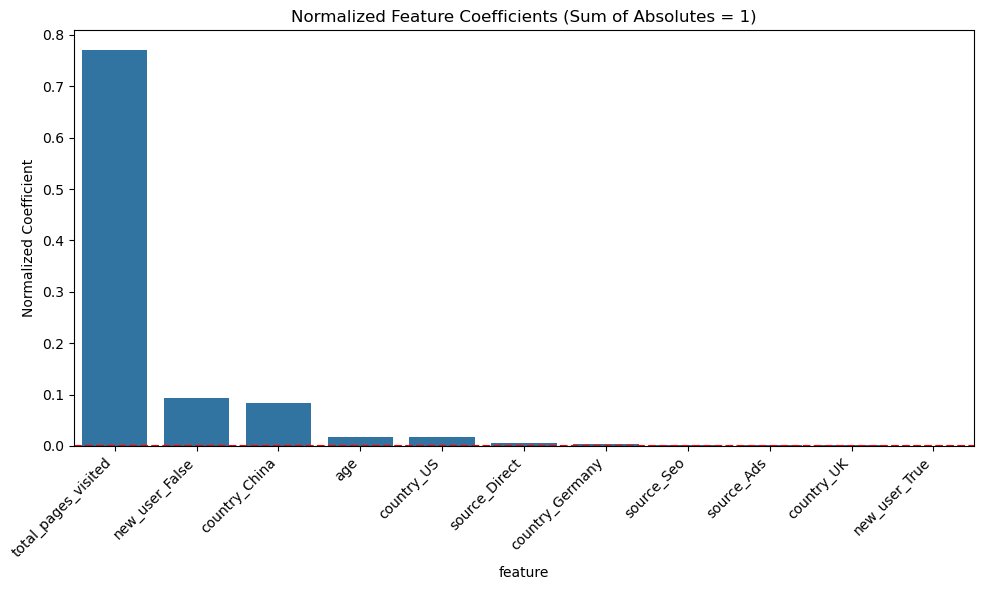

In [82]:
# Real value of coef

# Calculate the sum of the values of the coefficients
sum_abs_coef = abs(feature_df_best_model['coef']).sum()

# Normalize the coefficients
feature_df_best_model['normalized_coef_sum_to_one'] = feature_df_best_model['coef'] / sum_abs_coef

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_df_best_model.sort_values('normalized_coef_sum_to_one', ascending=False, key=abs), x='feature', y='normalized_coef_sum_to_one')
plt.axhline(y=0, color='r', linestyle='--')  # Line at zero for reference
plt.xticks(rotation=45, ha='right')
plt.title('Normalized Feature Coefficients (Sum of Absolutes = 1)')
plt.ylabel('Normalized Coefficient')
plt.tight_layout()
plt.show()

# VI/ conclusion

conformément a notre [notre eda](#eda), un des moyens d'amelioration serait de pousse les feature engenie... sur certaines colones comme: new_user ... etc ...